This is the template for the image recognition exercise. <Br>
Some **general instructions**, read these carefully:
 - The final assignment is returned as a clear and understandable *report*
    - define shortly the concepts and explain the phases you use
    - use the Markdown feature of the notebook for larger explanations
 - return your output as a *working* Jupyter notebook
 - name your file as Exercise_MLPR2023_Partx_uuid.jpynb
    - use the uuid code determined below
    - use this same code for each part of the assignment
 - write easily readable code with comments     
     - if you exploit code from web, provide a reference
 - it is ok to discuss with a friend about the assignment. But it is not ok to copy someone's work. Everyone should submit their own implementation
     - in case of identical submissions, both submissions are failed 

**Deadlines:**
- Part 1: Mon 6.2 at 23:59**
- Part 2: Mon 20.2 at 23:59**
- Part 3: Mon 6.3 at 23:59**

**No extensions for the deadlines** <br>
- after each deadline, example results are given, and it is not possible to submit anymore

**If you encounter problems, Google first and if you can’t find an answer, ask for help**
- Moodle area for questions
- pekavir@utu.fi
- teacher available for questions
    - Monday 30.1 at 14:00-15:00 room 407B Honka (Agora 4th floor)
    - Monday 13.2 at 14:00-15:00 room 407B Honka (Agora 4th floor)
    - Thursday 2.3 at lecture 10:15-12:00 

**Grading**

The exercise covers a part of the grading in this course. The course exam has 5 questions, 6 points of each. Exercise gives 6 points, i.e. the total score is 36 points.

From the template below, you can see how many exercise points can be acquired from each task. Exam points are given according to the table below: <br>
<br>
7 exercise points: 1 exam point <br>
8 exercise points: 2 exam points <br>
9 exercise points: 3 exam points <br>
10 exercise points: 4 exam points <br>
11 exercise points: 5 exam points <br>
12 exercise points: 6 exam points <br>
<br>
To pass the exercise, you need at least 7 exercise points, and at least 1 exercise point from each Part.
    
Each student will grade one submission from a peer and their own submission. After each Part deadline, example results are given. Study them carefully and perform the grading according to the given instructions. Mean value from the peer grading and self-grading is used for the final points. 

# Part 2

## Data exploration (2 p)

- Standardize the data
- Plot a boxplot of each feature
- Plot histogram of each feature, use a different color for each class
- Plot pairplot (each feature against each feature and the label against each feature)
- Discuss your findings from the above figures, e.g. can you spot features which might be very useful in predicting the correct class? 
- Fit PCA using two components
- Plot the PCA figure with two components, color the data points according to their species
- Can you see any clusters in PCA? Does this figure give you any clues, how well you will be able to classify the image types? Explain.
- How many PCA components are needed to cover 99% of the variance?
- Make clear figures, use titles and legends for clarification

## Model selection (2 p)

Select the best model for each classifier. Use 5-fold repeated cross validation with 3 repetitions (*RepeatedKFold* from sklearn). You can choose the hyperparameter ranges to use (i.e. from which values the best hyperparameters are selected if they are not stated below.) <br>

- k Nearest Neighbors classifier: hyperparameter k
- random forest: hyperparameters max_depth and max_features
- MLP: use one hidden layer and Early stopping. Hyperparameters:
    - number of neurons in the hidden layer
    - activation function: logistic sigmoid function and rectified linear unit function
    - solver: stochastic gradient descent and adam
    - validation_fraction: 0.1 and 0.5

For each classifier:
- Report the best hyperparameter or the best combination of hyperparameters. <br>
- Plot the accuracy versus the hyperparameter/hyperparameter combination and highlight the best value. <br>

For random forest model, report the feature importance for each feature. Which features seem to be the most important? Does this correspond with the observations you made in the data exploration? <br>
Ponder the model selection process. What things should be considered when selecting the model to be used?

In [181]:
import pandas as pd
import numpy as np
from numpy import mean
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.model_selection import RepeatedKFold, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn import metrics
import warnings



In [182]:
warnings.simplefilter(action='ignore', category=FutureWarning)

In [183]:
training_data = pd.read_csv('/MachLearning_&Pattern_recog/training_data/training_data.csv')
training_data.drop('Unnamed: 0',inplace=True, axis=1)
training_data

,mean_b,var_b,skew_b,kurt_b,entr_b,mean_g,var_g,skew_g,kurt_g,entr_g,...,kurt_r,entr_r,major_axis_length,minor_axis_length,area,perimeter,roundness,aspect_ratio,class,class_int
0,195.452977,4202.418471,-2.524436,4.861524,5.644326,191.887922,4088.068427,-2.482089,4.723842,5.708407,...,-0.435803,5.691280,135.895828,62.845917,6577.0,341.362478,0.709261,2.162365,Arb,0
1,221.059748,4131.584707,-2.972436,7.423969,5.352949,211.389636,3837.263163,-2.892630,7.113019,5.646854,...,-0.606069,5.609521,132.431091,71.392792,7217.5,352.007140,0.731971,1.854964,Arb,0
2,210.480022,4163.114124,-2.748286,6.207251,5.814053,205.847033,4041.849735,-2.677674,5.944826,5.916464,...,-0.208940,5.870909,136.888412,72.104820,7579.5,351.747256,0.769820,1.898464,Arb,0
3,203.160087,4350.678755,-2.638314,5.339818,5.523891,195.365092,4055.586789,-2.599136,5.213757,5.615278,...,-0.289399,5.582152,124.239815,67.806267,6574.0,330.877197,0.754581,1.832276,Arb,0
4,208.213253,4283.601858,-2.633616,5.631995,5.715528,202.223447,4064.266920,-2.606132,5.535874,5.742871,...,-0.274309,5.732230,140.889618,68.673462,7411.5,366.232535,0.694388,2.051588,Arb,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,224.641426,4764.525928,-2.906114,6.584495,4.643683,220.186986,4613.496042,-2.865794,6.439246,5.059834,...,1.399916,5.205495,206.526657,61.472656,9674.5,474.399056,0.540195,3.359651,Jas,2
296,188.222527,5257.480095,-2.138804,2.784284,5.427482,179.112804,4782.252767,-2.119467,2.737515,5.465896,...,0.272885,5.460902,172.561798,46.028122,6009.5,392.090401,0.491220,3.749051,Jas,2
297,217.266679,6195.327463,-2.385845,3.729420,4.233751,204.074962,5476.713514,-2.376330,3.704842,4.464155,...,1.001932,4.486015,151.605057,46.787834,5369.0,341.137083,0.579756,3.240267,Jas,2
298,176.797861,4409.015126,-2.242191,3.164801,4.905291,174.829734,4310.056143,-2.243467,3.168647,4.851910,...,1.782253,4.859188,147.041809,44.381569,4901.0,328.960459,0.569124,3.313128,Jas,2


In [184]:
features = ["mean_b","var_b","skew_b","kurt_b","entr_b","mean_g","var_g","skew_g","kurt_g","entr_g","mean_r","var_r","skew_r","kurt_r","entr_r","major_axis_length",
"minor_axis_length","area","perimeter","roundness","aspect_ratio"]
labels= ["class","class_int"]

In [185]:
scaler = StandardScaler()
scaler.fit(training_data[features])
scaled_features = scaler.transform(training_data[features])
scaled_features_data = pd.DataFrame(scaled_features, columns = features)
scaled_features_data["class"] = training_data["class"]
scaled_features_data["class_int"] = training_data["class_int"]
scaled_features_data

,mean_b,var_b,skew_b,kurt_b,entr_b,mean_g,var_g,skew_g,kurt_g,entr_g,...,kurt_r,entr_r,major_axis_length,minor_axis_length,area,perimeter,roundness,aspect_ratio,class,class_int
0,-0.930469,-0.899128,-0.005618,0.133681,1.374268,-0.296010,-0.640250,-0.019487,0.133650,1.079336,...,-0.802844,1.105931,-0.923106,0.733319,-0.120715,-0.839477,1.203725,-1.009419,Arb,0
1,1.412530,-0.978849,-1.730342,1.869376,0.786755,1.694490,-1.021416,-1.588730,1.774243,0.940971,...,-0.947085,0.912150,-1.025376,1.493031,0.379591,-0.642571,1.409467,-1.296130,Arb,0
2,0.444493,-0.943364,-0.867401,1.045222,1.716495,1.128768,-0.710491,-0.767086,0.972071,1.547021,...,-0.610656,1.531679,-0.893808,1.556322,0.662357,-0.647378,1.752367,-1.255558,Arb,0
3,-0.225275,-0.732264,-0.444029,0.457658,1.131431,0.058897,-0.689614,-0.466882,0.470063,0.869992,...,-0.678817,0.847280,-1.267159,1.174233,-0.123059,-1.033435,1.614309,-1.317291,Arb,0
4,0.237086,-0.807758,-0.425943,0.655567,1.517835,0.758916,-0.676422,-0.493623,0.691253,1.156806,...,-0.666034,1.202989,-0.775704,1.251316,0.531128,-0.379427,1.068978,-1.112741,Arb,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.740250,-0.266490,-1.475012,1.300751,-0.643358,2.592418,0.158279,-1.486150,1.311579,-0.378577,...,0.752295,-0.045453,1.161714,0.611253,2.298801,1.621452,-0.327960,0.107285,Jas,2
296,-1.592050,0.288318,1.479004,-1.273356,0.937038,-1.599941,0.414751,1.366593,-1.230316,0.534201,...,-0.202475,0.559899,0.159169,-0.761577,-0.564001,0.098895,-0.771664,0.470478,Jas,2
297,1.065467,1.343842,0.527937,-0.633159,-1.469916,0.947896,1.470171,0.384766,-0.566075,-1.717589,...,0.415141,-1.750730,-0.459415,-0.694048,-1.064307,-0.843647,0.030450,-0.004064,Jas,2
298,-2.637397,-0.666608,1.080983,-1.015610,-0.115870,-2.037105,-0.302879,0.892617,-0.934268,-0.845965,...,1.076194,-0.866252,-0.594109,-0.907935,-1.429871,-1.068891,-0.065871,0.063893,Jas,2


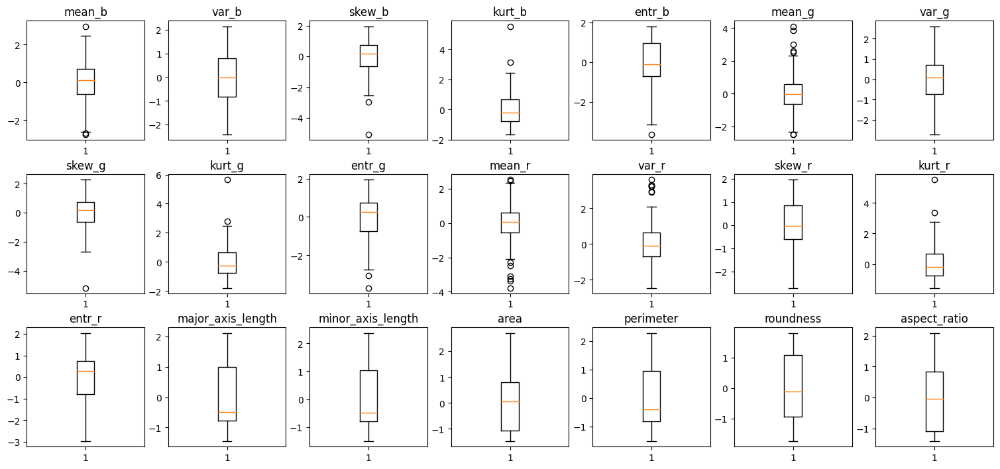

In [186]:
fig=plt.figure(figsize=(15,7))
for i, value in enumerate(features):
    plt.subplot(3,7,i+1)
    plt.boxplot(scaled_features_data[value]) 
    plt.title(f'{value}')
fig.tight_layout(pad=0.4)

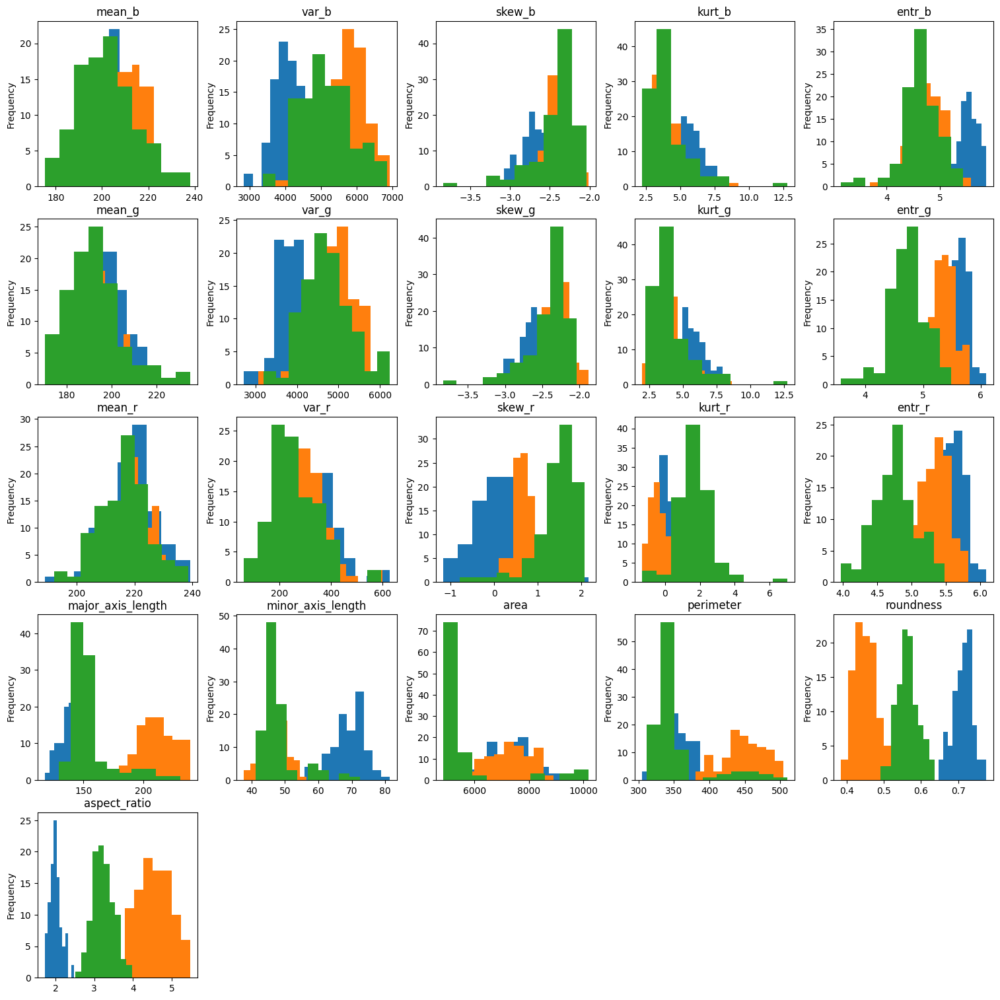

In [187]:
fig=plt.figure(figsize=(15,15))
for i, value in enumerate(features):
    df_copy=training_data.copy()
    plt.subplot(5,5,i+1)
    df_copy.groupby('class')[value].plot(kind='hist')
    plt.title(f'{value}')
fig.tight_layout(pad=0.2)

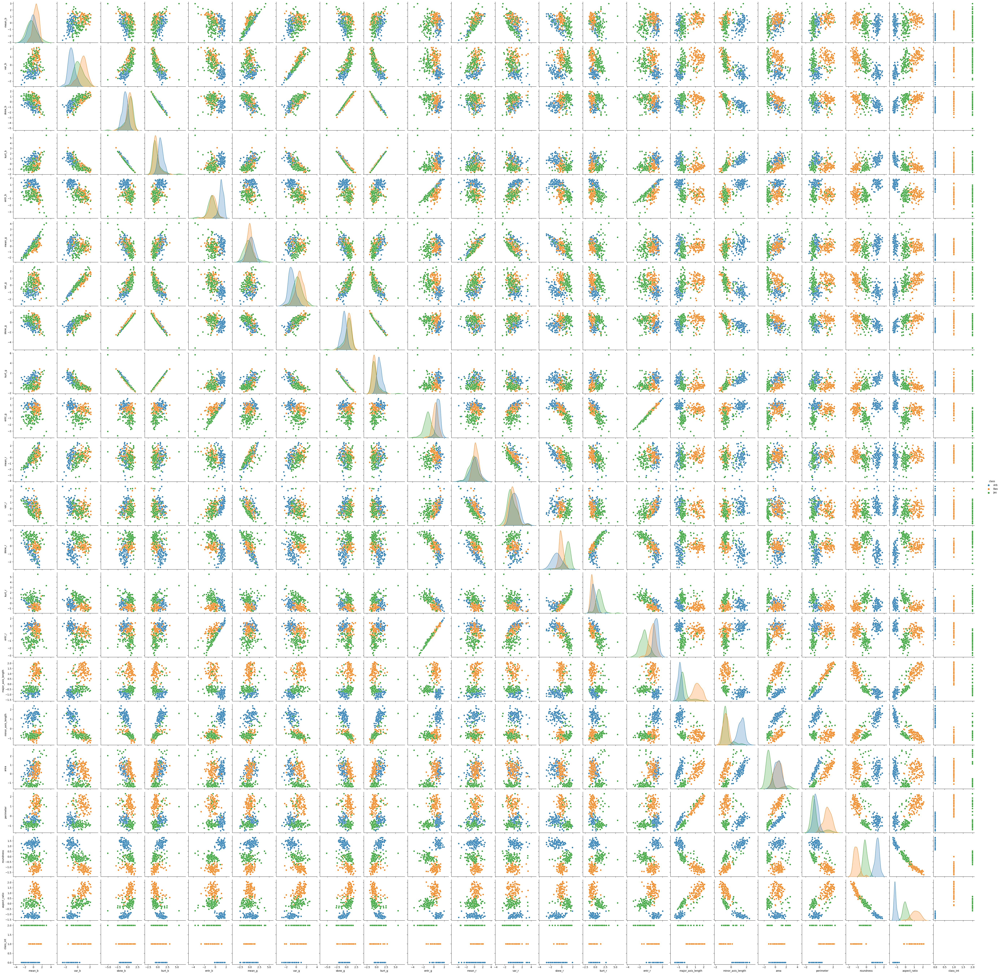

In [189]:
sns.pairplot(data = scaled_features_data, hue="class")

In the above pairplot even the class_int is also included though it is not a feature for simplicity. 

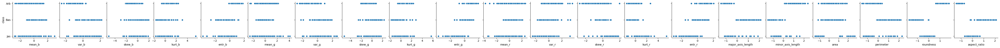

In [190]:
sns.pairplot(
    scaled_features_data,
    x_vars=features,
    y_vars='class')

In [191]:
pca = PCA(n_components = 2)
pca.fit(scaled_features_data[features])
pca_data = pca.transform(scaled_features_data[features])
pca_data = pd.DataFrame(pca_data, columns = ["PC1","PC2"])
pca_data["class_int"] = training_data["class_int"]
pca_data

,PC1,PC2,class_int
0,2.451836,1.213969,0
1,5.273176,-1.688584,0
2,4.663573,-0.750230,0
3,3.109322,0.893032,0
4,3.633789,-0.580635,0
...,...,...,...
295,1.857519,-3.144483,2
296,-2.298871,1.509267,2
297,-2.665859,-0.185425,2
298,-2.084220,4.608265,2


<AxesSubplot:xlabel='PC1', ylabel='PC2'>

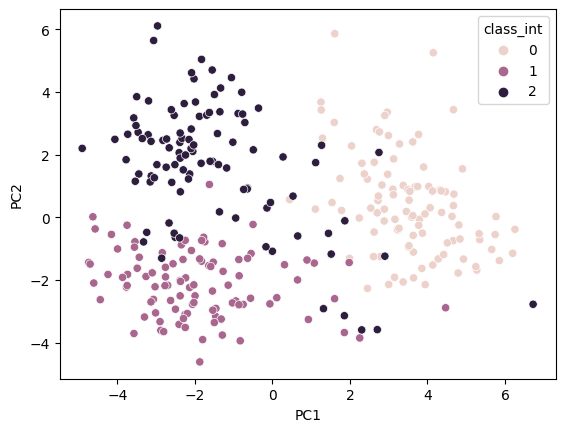

In [192]:
sns.scatterplot(x=pca_data["PC1"], y= pca_data["PC2"], hue = pca_data["class_int"])

**Yes the Plot above shows almost 3 clusters and I believe it can be classified using linear classifiers.**

In [193]:
# https://www.baeldung.com/cs/pca

pca = PCA()
pca.fit(scaled_features_data[features])
cumsum = (np.cumsum(pca.explained_variance_ratio_))
d = np.argmax(cumsum >= 0.99) + 1
print(d,"is the number of principal components needed to cover 99 percent variance")


9 is the number of principal components needed to cover 99 percent variance


In [194]:
# reference for repeated k fold cross validation https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RepeatedKFold.html
accuracy = []
rkf = RepeatedKFold(n_splits=5, n_repeats=3, random_state=2652124)
for k in range(1,31):
    performance = []
    kNN_classifier = KNeighborsClassifier(n_neighbors = k)
    for i, (train_index, test_index) in enumerate(rkf.split(scaled_features_data[features])):
        x_train, y_train = scaled_features_data[features].loc[train_index].values,scaled_features_data[labels[0]].loc[train_index].values
        x_test, y_test = scaled_features_data[features].loc[test_index].values,scaled_features_data[labels[0]].loc[test_index].values
        kNN_classifier.fit(x_train, y_train)
        y_predicted = kNN_classifier.predict(x_test)
        performance.append(metrics.accuracy_score(y_test,y_predicted))
    accuracy.append(mean(performance))

In [240]:
print("Best Accuracy is:",max(accuracy),"at K =",accuracy.index(max(accuracy))+1)

Best Accuracy is: 0.9888888888888888 at K = 3


<AxesSubplot:>

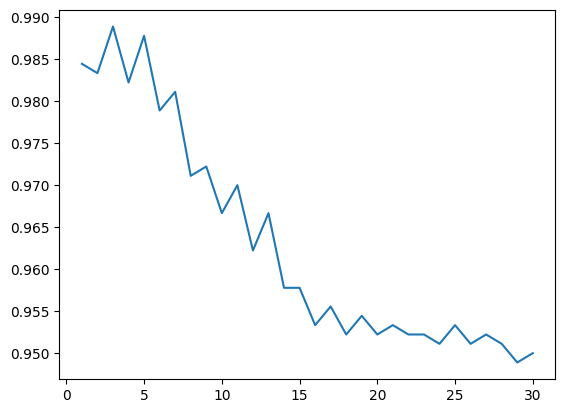

In [196]:
k = list(range(1,31))
sns.lineplot(y=accuracy, x = k)

- **KNN Best parameter tuning using GridSearchCV**

In [197]:
cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=2652124)
#setting up the parameters
kNN_classifier = KNeighborsClassifier()
n_neighbors = list(range(1,31))

param_grid = dict(n_neighbors = n_neighbors)
#model training and fitting
grid_search_knn = GridSearchCV(kNN_classifier, param_grid, cv=cv, scoring='accuracy')
grid_search_knn_fitting =  grid_search_knn.fit(scaled_features_data[features].values, scaled_features_data["class"].values)

In [243]:
print("Best parameters and its accuracy for knn is as below")
print(grid_search_knn_fitting.best_params_)
print(grid_search_knn_fitting.best_score_)

Best parameters and its accuracy for knn is as below
{'n_neighbors': 3}
0.9888888888888888


- **Random forest Best parameter tuning using loops and Manual training**


In [229]:
accuracy_random_forest = []
maxdepth = list(range(1,10,2))
maxfeatures = ['auto','sqrt']
indexes = []
rkf = RepeatedKFold(n_splits=5, n_repeats=3, random_state=2652124) 
for i in maxdepth: 
    for j in maxfeatures:
        performance = []
        indexes.append((i,j))
        for k, (train_index, test_index) in enumerate(rkf.split(scaled_features_data[features])): 
            rf = RandomForestClassifier(max_features=j, max_depth = i)
            x_train, y_train = scaled_features_data[features].loc[train_index].values,scaled_features_data[labels[0]].loc[train_index].values
            x_test, y_test = scaled_features_data[features].loc[test_index].values,scaled_features_data[labels[0]].loc[test_index].values
            rf.fit(x_train, y_train)
            y_predicted = rf.predict(x_test)
            performance.append(metrics.accuracy_score(y_test,y_predicted))
        accuracy_random_forest.append(mean(performance))

In [247]:
print("Best parameters and its accuracy for Random forest is as below")
print(indexes[accuracy_random_forest.index(max(accuracy_random_forest))])
print(max(accuracy_random_forest))

Best parameters and its accuracy for Random forest is as below
(5, 'sqrt')
0.9966666666666666


- **Random forest Best parameter tuning using GridSearchCV**

In [232]:
cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=2652124)
#setting up the parameters
rf = RandomForestClassifier()
maxdepth = list(range(1,10,2))
maxfeatures = ['auto','sqrt']

param_grid = dict(max_depth= maxdepth, max_features = maxfeatures)
#model training and fitting
grid_search_rf = GridSearchCV(rf, param_grid, cv=cv, scoring='accuracy')
grid_search_fitting =  grid_search_rf.fit(scaled_features_data[features].values, scaled_features_data["class"].values)

In [248]:
print("Best parameters and its accuracy for Random forest is as below")
print(grid_search_fitting.best_params_)
print(grid_search_fitting.best_score_)

Best parameters and its accuracy for Random forest is as below
{'max_depth': 7, 'max_features': 'sqrt'}
0.9966666666666666


- **Multi Layer Perceptron Best parameter tuning using GridSearchCV**

In [234]:
cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=2652124)
#setting up the parameters
multi_layer_perceptron = MLPClassifier(early_stopping= True)
hidden_layer_sizes = [(100, 50, 25),(150,120,90),(125, 75,25)]
activation = ['relu','logistic']
solver = ['sgd','adam']
validation_fraction = [0.1,0.5]

param_grid = dict(hidden_layer_sizes= hidden_layer_sizes, activation = activation,
solver = solver, validation_fraction = validation_fraction)
#model training and fitting
grid_search_mlp = GridSearchCV(multi_layer_perceptron, param_grid, cv=cv, scoring='accuracy')
grid_search =  grid_search_mlp.fit(scaled_features_data[features].values, scaled_features_data["class"].values)

In [249]:
print("Best parameters and its accuracy for MLP is as below")
print(grid_search.best_params_)
print(grid_search.best_score_)

Best parameters and its accuracy for MLP is as below
{'activation': 'relu', 'hidden_layer_sizes': (150, 120, 90), 'solver': 'adam', 'validation_fraction': 0.5}
0.9666666666666666


In [238]:
f_importance =RandomForestClassifier(max_depth= 7, max_features='sqrt') 
f_importance.fit(scaled_features_data[features].values, scaled_features_data["class"].values)
feature_importance = f_importance.feature_importances_

In [239]:
for i, value in enumerate(features):
    print(value,"feature_importance is:", feature_importance[i])

mean_b feature_importance is: 0.007554262044277823
var_b feature_importance is: 0.01654100632578991
skew_b feature_importance is: 0.004746504697423926
kurt_b feature_importance is: 0.004766818716880038
entr_b feature_importance is: 0.05736628496878636
mean_g feature_importance is: 0.006064244009622636
var_g feature_importance is: 0.0043070813575167375
skew_g feature_importance is: 0.008150048640236756
kurt_g feature_importance is: 0.006418309662104391
entr_g feature_importance is: 0.04945670221590757
mean_r feature_importance is: 0.0035954173102523256
var_r feature_importance is: 0.001978583531453277
skew_r feature_importance is: 0.03380031818678357
kurt_r feature_importance is: 0.04970062661258438
entr_r feature_importance is: 0.03386338608867386
major_axis_length feature_importance is: 0.08597880393980885
minor_axis_length feature_importance is: 0.12037522177206388
area feature_importance is: 0.04971085266180598
perimeter feature_importance is: 0.09726640994802632
roundness feature_i

- **From The above values we could clearly see that roundedness,aspectratio,minor_axis_length,major_axis_length and perimeter features are considered to be some of the very important features for model training and image classification.**
- **Yes from the histplot with the hue we could clearly see that aspect ratio and roundness and some others are clearly distinguishing the different classes unlike teh otehr features which is matching with feature importances here**


**Below are a few important things to be considered When selecting a model.**
- What type of data it is example linear data or non linear data.
- what sort of target laebls are for instance categorical or numerical labels
- Suitability of the model whether it works or not for instance knn regerssion or classification works better for linear data.
- Parameter tuning and Efficieny of the model needed.
- Cost efficency of the model is also considered one of the important factors in selecting the right model as per the project budget.